# Mobility Patterns Analysis in Cambridge
Mobility functions
- Predict routes, travel mode
- Map movements
Urban Application Kindergarten Planning
- Plan from mobility data
- Analyze street graph centrality measures
- Map with land use

## Install Libraries

In [3]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [22]:
import pandas as pd
import movingpandas as mpd
import hvplot.pandas
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as ctx
import networkx as nx
import osmnx as ox
import folium
from folium import plugins
from folium.plugins import FloatImage
from branca.element import Element, Template
from shapely.geometry import LineString, Point
from matplotlib.lines import Line2D
import matplotlib.colors as mcolors
from matplotlib.patches import Patch

## Import, explore, clean data

In [2]:
#download data, preliminary explorations and a bit of cleaning
cambridgemob = pd.read_csv("Cambridge_gowalla.csv")
print(cambridgemob.head())

   ID  User_ID        date      Time       lon        lat   loc_ID
0   1      382  12/09/2010  08:46:10  0.102380  52.173123  1307095
1   2     1050  14/08/2010  07:34:30  0.123451  52.197975  1735486
2   3     1050  14/08/2010  07:31:37  0.122774  52.197910   654162
3   4     1050  13/08/2010  21:07:46  0.116429  52.210057   516769
4   5     1050  13/08/2010  21:07:38  0.116200  52.210010    21381


In [3]:
cambridgemob.dtypes

ID           int64
User_ID      int64
date        object
Time        object
lon        float64
lat        float64
loc_ID       int64
dtype: object

In [4]:
len(cambridgemob)

1871

In [5]:
# convert date and time columns to datetime type
cambridgemob['datetime'] = cambridgemob['date'] + ' ' + cambridgemob['Time']

# convert the combined string into a datetime64 type
cambridgemob['datetime'] = pd.to_datetime(cambridgemob['datetime'], format='%d/%m/%Y %H:%M:%S')

# drop the original date and Time columns
cambridgemob.drop(['date', 'Time'], axis=1, inplace=True)

print(cambridgemob.head())

   ID  User_ID       lon        lat   loc_ID            datetime
0   1      382  0.102380  52.173123  1307095 2010-09-12 08:46:10
1   2     1050  0.123451  52.197975  1735486 2010-08-14 07:34:30
2   3     1050  0.122774  52.197910   654162 2010-08-14 07:31:37
3   4     1050  0.116429  52.210057   516769 2010-08-13 21:07:46
4   5     1050  0.116200  52.210010    21381 2010-08-13 21:07:38


# Mobility functions

## Create route-finding function
Pull data for each user from cambridgemob, calculate route, travel mode, and add additional data

In [7]:
def calculate_route_details_for_user(cambridgemob, user_id, date):
    """
    filters the mobility df for a specific user and date, then calculates route details.

    parameters:
    - cambridgemob: the full df containing mobility data for multiple users
    - user_id: the specific user ID to filter for.
    - date: the date to filter the mobility data.

    returns:
    - dataframe holding route, travel time, avg speed
    """
    # convert the date string to a datetime object
    date = pd.to_datetime(date)
    
    # filter for the specific user and date
    user_data = cambridgemob[(cambridgemob['User_ID'] == user_id) & (cambridgemob['datetime'].dt.date == date.date())]
    
    # ensure the data is in chronological order
    user_data = user_data.sort_values(by='datetime').reset_index(drop=True)

    #create graph from geographical bounds of user data
    min_lat, max_lat = user_data['lat'].min(), user_data['lat'].max()
    min_lon, max_lon = user_data['lon'].min(), user_data['lon'].max()

    # expand the bounding box slightly to ensure the graph covers all routes
    delta = 0.01  # create buffer
    north, south, east, west = max_lat + delta, min_lat - delta, max_lon + delta, min_lon - delta

    # create graphs
    Gwalk = ox.graph_from_bbox(north, south, east, west, network_type='walk')
    Gbike = ox.graph_from_bbox(north, south, east, west, network_type='bike')
    Gdrive = ox.graph_from_bbox(north, south, east, west, network_type='drive')
    
    # function to get data from df, graph and time
    def calculate_route_details(G, origin_point, destination_point, travel_time_hours):
        # Find the nearest nodes in the graph for origin and destination points
        origin_node = ox.nearest_nodes(G, origin_point['lon'], origin_point['lat'])
        destination_node = ox.nearest_nodes(G, destination_point['lon'], destination_point['lat'])
        
        # Calculate route and details
        route = nx.shortest_path(G, origin_node, destination_node, weight='length')
        route_length_m = nx.shortest_path_length(G, origin_node, destination_node, weight='length')
        route_length_km = route_length_m / 1000
        average_speed_kmph = route_length_km / travel_time_hours if travel_time_hours > 0 else 0
        
        # Convert node IDs in the route to geographic coordinates
        route_coords = [(G.nodes[node]['x'], G.nodes[node]['y']) for node in route]
        origin_coords = (G.nodes[origin_node]['x'], G.nodes[origin_node]['y'])
        destination_coords = (G.nodes[destination_node]['x'], G.nodes[destination_node]['y'])

        if G == Gwalk:
            travel_type = 'walk'
        if G == Gbike:
            travel_type = 'bike'
        if G == Gdrive:
            travel_type = 'drive'
    
        # Compile and return the route details
        route_details = {
            'origin_coords': origin_coords,
            'destination_coords': destination_coords,
            'route_coords': route_coords,
            'route_length_m': route_length_m,
            'average_speed_kmph': average_speed_kmph,
            'travel_type': travel_type
        }
        
        return route_details
    
    route_list = []  # initialize the list to hold route details

    for i in range(len(user_data) - 1):
        origin_point = user_data.iloc[i]
        destination_point = user_data.iloc[i + 1]

        # find independent time points for speed calculations
        travel_time_delta = destination_point['datetime'] - origin_point['datetime']
        travel_time_hours = travel_time_delta.total_seconds() / 3600
        arrival_time = destination_point['datetime']

        # start with a walking graph
        G = Gwalk

        route_details = calculate_route_details(G, origin_point, destination_point, travel_time_hours)

        # check if average speed indicates biking or driving instead of walking
        if route_details['average_speed_kmph'] > 10:
            G = Gbike if route_details['average_speed_kmph'] < 30 else Gdrive
            #recalculate route details with new graph
            route_details = calculate_route_details(G, origin_point, destination_point, travel_time_hours)

        # append details to the list of dicts
        route_list.append({
            'user_id': user_id,
            'origin_coords': route_details['origin_coords'],
            'destination_coords': route_details['destination_coords'],
            'route_coords': route_details['route_coords'],
            'route_length_m': route_details['route_length_m'],
            'travel_time': travel_time_delta,  # To find average speed
            'average_speed_kmph': route_details['average_speed_kmph'],  # To check what the travel type is
            'arrival_time': arrival_time,  # To check that the destinations are chronological
            'travel_type': route_details['travel_type']
        })

    # convert list of dictionaries to DataFrame
    route_df = pd.DataFrame(route_list)

    return route_df

### Calculate routes for users 75027 and 102829

In [8]:
# calculate for user 75027
user_id = 75027
date = '2010-01-30'
route75027 = calculate_route_details_for_user(cambridgemob, user_id, date)
route75027

,user_id,origin_coords,destination_coords,route_coords,route_length_m,travel_time,average_speed_kmph,arrival_time,travel_type
0,75027,"(0.1730106, 52.1571208)","(0.1463608, 52.2048442)","[(0.1730106, 52.1571208), (0.1729678, 52.15701...",7169.504,0 days 00:50:21,8.543600,2010-01-30 16:04:04,walk
1,75027,"(0.1463608, 52.2048442)","(0.1443813, 52.2051714)","[(0.1463608, 52.2048442), (0.1465086, 52.20506...",1086.558,0 days 00:02:53,22.610455,2010-01-30 16:06:57,bike
2,75027,"(0.1443813, 52.2051714)","(0.1447362, 52.2057333)","[(0.1443813, 52.2051714), (0.1445138, 52.20566...",79.231,0 days 00:08:38,0.550640,2010-01-30 16:15:35,walk
3,75027,"(0.1447362, 52.2057333)","(0.1465898, 52.2098344)","[(0.1447362, 52.2057333), (0.1446171, 52.20575...",533.681,0 days 00:44:10,0.725001,2010-01-30 16:59:45,walk
4,75027,"(0.1465898, 52.2098344)","(0.1448195, 52.2093105)","[(0.1465898, 52.2098344), (0.1465262, 52.20979...",172.892,0 days 00:05:56,1.748346,2010-01-30 17:05:41,walk
5,75027,"(0.1448195, 52.2093105)","(0.1442818, 52.2114289)","[(0.1448195, 52.2093105), (0.145018, 52.209257...",560.192,0 days 00:15:14,2.206446,2010-01-30 17:20:55,walk
6,75027,"(0.1442818, 52.2114289)","(0.1273227, 52.1993476)","[(0.1442818, 52.2114289), (0.1453246, 52.21097...",2119.355,0 days 04:06:55,0.514997,2010-01-30 21:27:50,walk
7,75027,"(0.1273227, 52.1993476)","(0.1240898, 52.2029011)","[(0.1273227, 52.1993476), (0.1263182, 52.20044...",452.739,0 days 00:46:21,0.586070,2010-01-30 22:14:11,walk


In [9]:
# calculate for user102829
user_id = 102829
date = '2010-05-24'
route102829 = calculate_route_details_for_user(cambridgemob, user_id, date)
route102829

,user_id,origin_coords,destination_coords,route_coords,route_length_m,travel_time,average_speed_kmph,arrival_time,travel_type
0,102829,"(0.1372361, 52.1944145)","(0.0907007, 52.2095774)","[(0.1372361, 52.1944145), (0.1372705, 52.19426...",4547.452,0 days 01:15:32,3.612274,2010-05-24 12:14:26,walk
1,102829,"(0.0907007, 52.2095774)","(0.0938214, 52.2125618)","[(0.0907007, 52.2095774), (0.0904571, 52.20959...",513.508,0 days 02:05:40,0.245176,2010-05-24 14:20:06,walk
2,102829,"(0.0938214, 52.2125618)","(0.1153556, 52.1942632)","[(0.0938214, 52.2125618), (0.0942481, 52.21250...",3128.233,0 days 02:56:06,1.065837,2010-05-24 17:16:12,walk
3,102829,"(0.1153556, 52.1942632)","(0.1175459, 52.203796)","[(0.1153556, 52.1942632), (0.1153852, 52.19487...",1326.393,0 days 00:17:00,4.681387,2010-05-24 17:33:12,walk
4,102829,"(0.1175459, 52.203796)","(0.1174117, 52.2100434)","[(0.1175459, 52.203796), (0.1176627, 52.204569...",818.330,0 days 00:15:52,3.094525,2010-05-24 17:49:04,walk
5,102829,"(0.1174117, 52.2100434)","(0.118477, 52.2084563)","[(0.1174117, 52.2100434), (0.1179597, 52.21018...",282.698,0 days 00:57:49,0.293374,2010-05-24 18:46:53,walk
6,102829,"(0.118477, 52.2084563)","(0.1102822, 52.1960286)","[(0.118477, 52.2084563), (0.1185074, 52.208410...",1687.380,0 days 01:47:51,0.938737,2010-05-24 20:34:44,walk


## Create plotting function

### Basic plot with geopandas

In [10]:
def plot_route(df, user_id, date):
    """
    plots a df containing routes and their origin and destination coordinates, uses geopandas with geodataframes

    parameters:
    - df: df containing columns 'route_coords', 'origin_coords', and 'destination_coords',
          where 'route_coords' is a list of (lon, lat) tuples for the route,
          and 'origin_coords' and 'destination_coords' are (lon, lat) tuples for the start and end.
    """
    # convert routes from coordinates to LineStrings
    df['geometry'] = df['route_coords'].apply(LineString)

    # create a gdf for the route
    gdf = gpd.GeoDataFrame(df, geometry='geometry', crs="EPSG:4326")

    # extract origin and destination points for plotting
    origins = [Point(xy) for xy in gdf['origin_coords']]
    destinations = [Point(xy) for xy in gdf['destination_coords']]

    # create GeoDataFrames for origins and destinations
    gdf_origins = gpd.GeoDataFrame(geometry=origins, crs="EPSG:4326").to_crs(epsg=3857)
    gdf_destinations = gpd.GeoDataFrame(geometry=destinations, crs="EPSG:4326").to_crs(epsg=3857)

    # convert for contextily
    gdf_web_mercator = gdf.to_crs(epsg=3857)

    # make plot
    fig, ax = plt.subplots(figsize=(10, 10))

    # plot origins and destinations in blue
    gdf_origins.plot(ax=ax, color='black', markersize=15, label='Check-in Points')
    gdf_destinations.plot(ax=ax, color='black', markersize=15)
    
    # Plot route
    travel_type_colors = {
        'walk': 'green',
        'bike': 'blue',
        'drive': 'red'}

    # Plot each travel type in its assigned color
    for travel_type, color in travel_type_colors.items():
        gdf_subset = gdf_web_mercator[gdf_web_mercator['travel_type'] == travel_type]
        gdf_subset.plot(ax=ax, color=color, label=travel_type.capitalize())

    # add OSM as background
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

    # customize the plot
    ax.set_axis_off()
    ax.legend(title=f"User{user_id} | {date}")
    plt.show()

### Interactive plot with folium

In [11]:
#create additional interactive map for later urban planning
def plot_route_interactive(df):
    """
    plots an interactive map containing routes and their origin and destination coordinates.

    parameters:
    - df: df containing columns 'route_coords', 'origin_coords', 'destination_coords',
          where 'route_coords' is a list of (lon, lat) tuples for the route,
          and 'origin_coords' and 'destination_coords' are (lon, lat) tuples for the start and end.
    """
    # center the map
    map_center = [df['route_coords'].iloc[0][0][1], df['route_coords'].iloc[0][0][0]]  # Latitude, Longitude
    m = folium.Map(location=map_center, zoom_start=13)

    travel_type_colors = {
        'walk': 'green',
        'bike': 'blue',
        'drive': 'red'
    }
    
        # iterate through DataFrame rows to plot each route and its points
    for _, row in df.iterrows():
        # reverse coords from (lon, lat) to (lat, lon) for folium and plot route
        route_coords = [(lat, lon) for lon, lat in row['route_coords']]
        folium.PolyLine(
            locations=route_coords,
            color=travel_type_colors.get(row['travel_type'], 'gray'),
            weight=2,
            opacity=0.5
        ).add_to(m)

    # add origin and destination points
    for _, row in df.iterrows():
        folium.CircleMarker(
            location=row['origin_coords'][::-1],  # reverse coords for folium (lat, lon)
            radius=1,
            color='black',
            fill=True,
            fill_color='black'
        ).add_to(m)
        folium.CircleMarker(
            location=row['destination_coords'][::-1],  # reverse coords for folium (lat, lon)
            radius=1,
            color='black',
            fill=True,
            fill_color='black'
        ).add_to(m)

    # display the map
    return m

## Combine route-finding and plotting functions

In [12]:
def route_and_plot(cambridgemob, user_id, date):
    """
    combines two previous functions to route and plot in one go
    """
    df = calculate_route_details_for_user(cambridgemob, user_id, date)
    plot_route(df, user_id, date)

## Plot both user's routes

/var/folders/lx/144t732x4hs49_9vxz4j63rh0000gn/T/ipykernel_34485/1278270815.py:43: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_subset.plot(ax=ax, color=color, label=travel_type.capitalize())


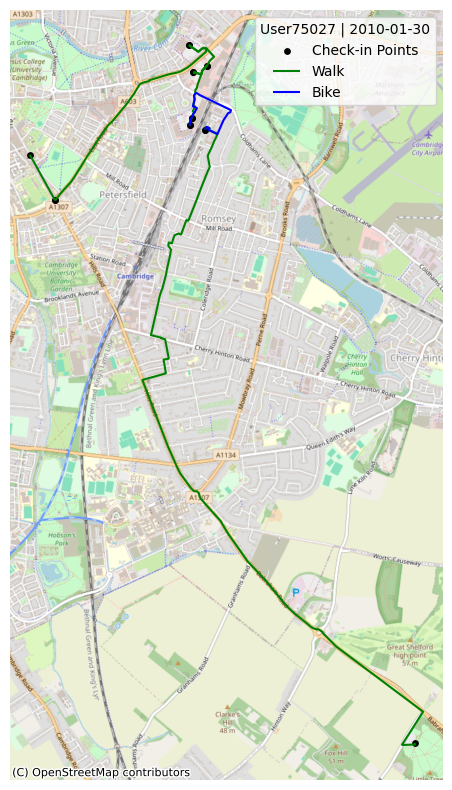

In [13]:
user_id = 75027
date = '2010-01-30'
route_and_plot(cambridgemob, user_id, date)

/var/folders/lx/144t732x4hs49_9vxz4j63rh0000gn/T/ipykernel_34485/1278270815.py:43: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_subset.plot(ax=ax, color=color, label=travel_type.capitalize())
/var/folders/lx/144t732x4hs49_9vxz4j63rh0000gn/T/ipykernel_34485/1278270815.py:43: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_subset.plot(ax=ax, color=color, label=travel_type.capitalize())


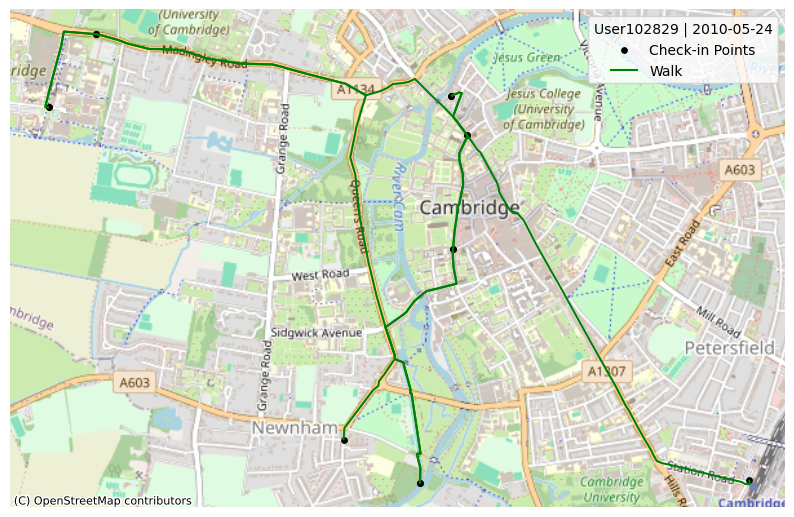

In [14]:
user_id = 102829
date = '2010-05-24'
route_and_plot(cambridgemob, user_id, date)

## Summarize route data
create table reporting
- maximum displacement (maximum distance between two consecutive locations they moved between)
- average displacement (average distance between two consecutive locations)
- total distance travelled on the day

All distances in network distance

In [15]:
def summarize_route(df):
    """
    calculate and return maximum, average, and total route lengths from a dataframe
    """
    user_id = df['user_id'].iloc[0]
    date = df['arrival_time'].iloc[0].date()

    # calculate route length statistics
    max_length = df['route_length_m'].max()
    avg_length = df['route_length_m'].mean()
    total_length = df['route_length_m'].sum()
    
    # create summary df
    summary_df = pd.DataFrame({
        'user_id': [user_id],
        'date': [date],
        'max_route_m': [max_length],
        'avg_route_m': [avg_length],
        'total_route_m': [total_length]
    })
    
    return summary_df

In [16]:
# create tables for users 75027 and 102829
summary75027 = summarize_route(route75027)
summary102829 = summarize_route(route102829)

#append into a single df
total_summary = pd.concat([summary75027, summary102829], ignore_index=True)
total_summary

,user_id,date,max_route_m,avg_route_m,total_route_m
0,75027,2010-01-30,7169.504,1521.769000,12174.152
1,102829,2010-05-24,4547.452,1757.713429,12303.994


# Urban Application Planning Question

Choose a new location to build a kindergarten

## Plot all recorded routes, stops

Adjust previous functions to graph all journeys from the mobility dataset and determine travel modes

Place kindergarten in central, accessible location that does not experience too much car traffic

### Clean data

In [17]:
# group by userid and date part of the datetime
grouped = cambridgemob.groupby([cambridgemob['User_ID'], cambridgemob['datetime'].dt.date])

# prepare an empty df to collect all routes
all_routes_df = pd.DataFrame()

# iterate through the user/date groups
for (user_id, date), group in grouped:
    if len(group) > 1:  # check if the group has more than one entry
        # apply the function for this user and date
        route_df = calculate_route_details_for_user(cambridgemob, user_id, date.strftime('%Y-%m-%d'))
        
        # append the results
        all_routes_df = pd.concat([all_routes_df, route_df], ignore_index=True)

all_routes_df

KeyboardInterrupt: 

In [ ]:
# clean to remove non-journeys
all_routes_clean = all_routes_df[all_routes_df['route_length_m'] != 0]

### All routes interactive plot

In [52]:
#plot results
map = plot_route_interactive(all_routes_clean)

# add points not associated with a journey - where user only recorded one stop that day
#gdf_cambridge_mob = gpd.GeoDataFrame(cambridgemob, geometry=gpd.points_from_xy(cambridgemob.lon, cambridgemob.lat))
# plot gdf on top of the existing plot
#gdf_cambridge_mob.plot(ax=ax, color='black', markersize=15, zorder=5)  # Customize marker and color as needed

for index, row in cambridgemob.iterrows():
    # Create a marker for each point and add it to the existing map
    folium.CircleMarker(
        location=(row['lat'], row['lon']),
        radius=1,
        color='black',
        fill=True,
        fill_color='black'
    ).add_to(map)

image_file = './legend.png'  # The path is correct since it's in the same folder
FloatImage(image_file, bottom=0, left=0).add_to(map)

map

### Driving only interactive plot

In [462]:
# create driving only map
all_routes_driven = all_routes_clean[all_routes_clean['travel_type'] == 'drive']
drive_map = plot_route_interactive(all_routes_driven)
drive_map

### Non-driving interactive plot

In [461]:
# create non-driving map
all_routes_notdriven = all_routes_clean[all_routes_clean['travel_type'] != 'drive']
nodrive_map = plot_route_interactive(all_routes_notdriven)
nodrive_map

## Centrality Mapping

Show accessibility in a different way - demonstrate node connectivity for this area

Look at edge degree centrality to find an area that is well-connected, and betweenness centrality to find an area that is not overly traversed

### Edge degree centrality
Using the walk graph network to find streets that are pedestrian accessible and well connected on foot

In [18]:
# create graph of central Cambridge
Gwalk = ox.graph_from_address('Cambridge, UK', dist=3000, network_type='walk')

In [19]:
# some of the centrality measures are not implemented on multiGraph so first set as diGraph
DGwalk = ox.get_digraph(Gwalk)

In [20]:
# convert graph into a line graph so edges become nodes
edge_dcwalk = nx.degree_centrality(nx.line_graph(DGwalk))

# set the attributes back to its edge
nx.set_edge_attributes(DGwalk, edge_dcwalk,'dc')

# turn back to multiGraph for plotting
MGwalk = nx.MultiGraph(DGwalk)

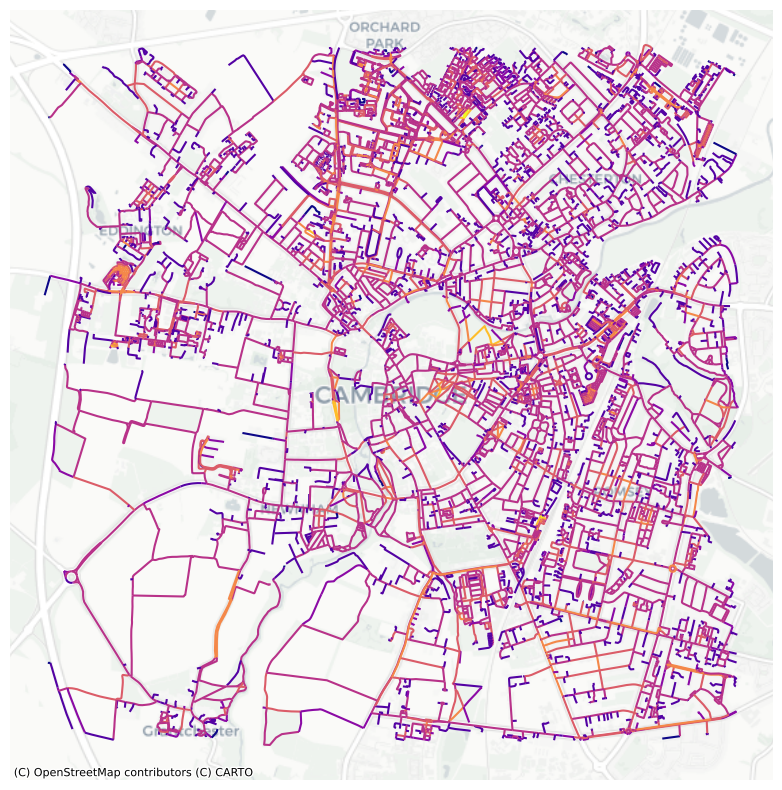

In [23]:
# convert graph to geopandas dataframe
gdf_edges_walk = ox.graph_to_gdfs(MGwalk,nodes=False,fill_edge_geometry=True)

# set crs to 3857 (needed for contextily)
gdf_edges_walk = gdf_edges_walk.to_crs(epsg=3857) # setting crs to 3857

# plot edges according to degree centrality
ax=gdf_edges_walk.plot('dc',cmap='plasma',figsize=(10,10))
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

### Betweenness centrality
Using the drive graph network to find areas that are not likely to have much road traffic

In [29]:
# create graph of central Cambridge
Gdrive = ox.graph_from_address('Cambridge, UK', dist=3000, network_type='drive')

In [30]:
# some of the centrality measures are not implemented on multiGraph so first set as diGraph
DGdrive = ox.get_digraph(Gdrive)

In [31]:
# calculate edge betweeness centrality: please stop if this takes too long.
edge_bcdrive = nx.betweenness_centrality(nx.line_graph(DGdrive))

In [32]:
# set or inscribe the centrality measure of each node as an edge attribute of the graph network object
nx.set_edge_attributes(DGdrive,edge_bcdrive,'bc')
MGdrive = nx.MultiGraph(DGdrive)

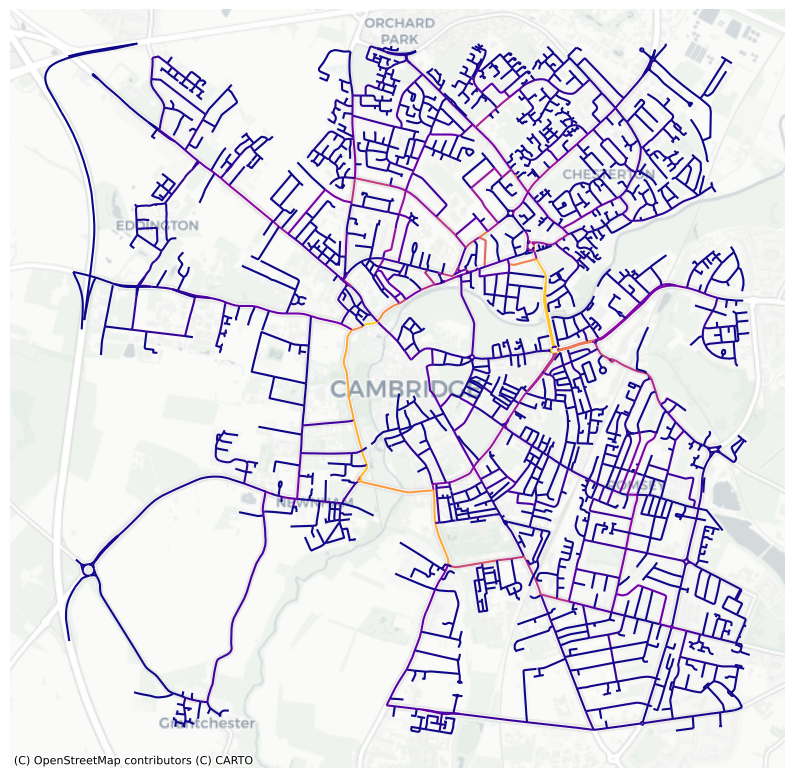

In [33]:
# convert graph to geopandas dataframe
gdf_edges_drive = ox.graph_to_gdfs(MGdrive,nodes=False,fill_edge_geometry=True)

# set crs to 3857 (needed for contextily)
gdf_edges_drive = gdf_edges_drive.to_crs(epsg=3857) # setting crs to 3857

# plot edges according to degree centrality
ax=gdf_edges_drive.plot('bc',cmap='plasma',figsize=(10,10))
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

## Create a map plotting accessible pedestrian roads and risky car roads

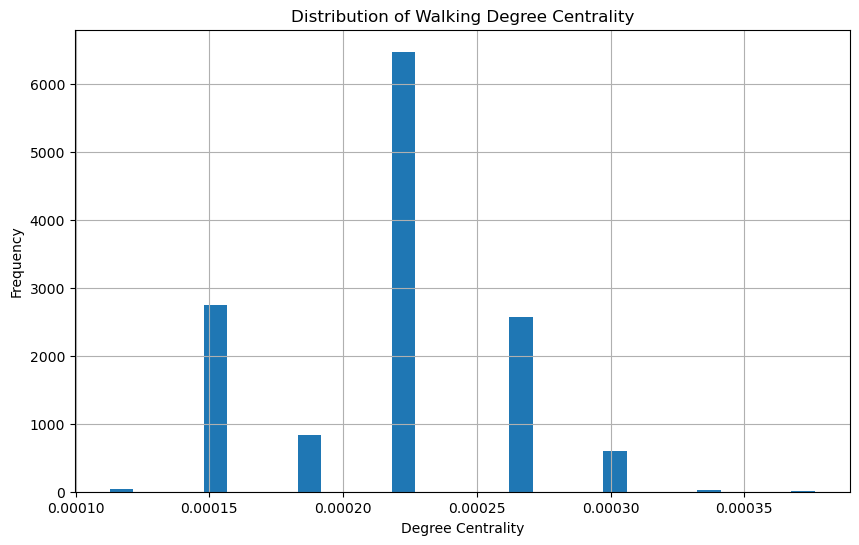

In [34]:
gdf_edges_walk['dc'].hist(bins=30, figsize=(10, 6))
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Walking Degree Centrality')
plt.show()

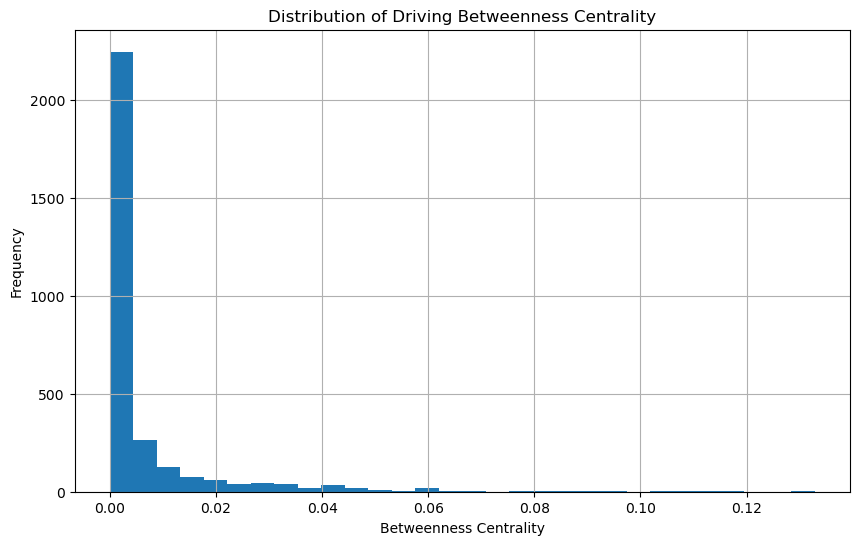

In [35]:
gdf_edges_drive['bc'].hist(bins=30, figsize=(10, 6))
plt.xlabel('Betweenness Centrality')
plt.ylabel('Frequency')
plt.title('Distribution of Driving Betweenness Centrality')
plt.show()

In [36]:
# Keep roads with pedestrian accessibility over 0.00025
gdf_pedestrian_filtered = gdf_edges_walk[gdf_edges_walk['dc'] >= 0.00025]
# Keep roads with driving betweenness centrality over 0.02
gdf_driving_filtered = gdf_edges_drive[gdf_edges_drive['bc'] >= 0.02]

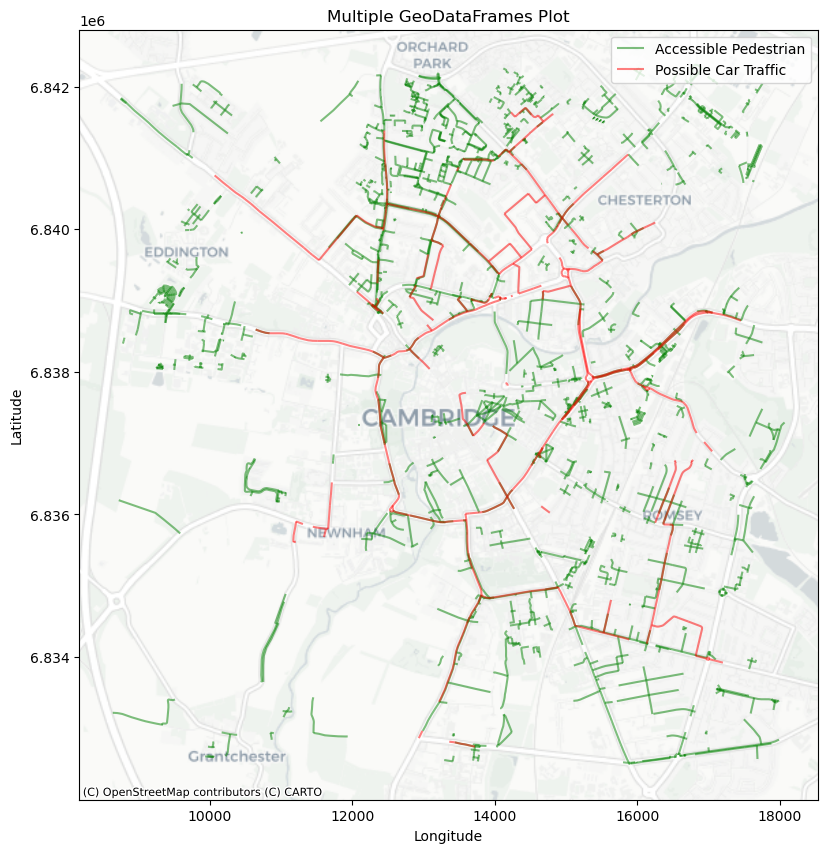

In [69]:
fig, ax = plt.subplots(figsize=(10, 10))  # Create a figure and a set of subplots

# Plot the first GeoDataFrame
gdf_pedestrian_filtered.plot(ax=ax, color='green', edgecolor='black', alpha=0.5, label='Accessible Pedestrian')

# Plot the second GeoDataFrame on the same axes object
gdf_driving_filtered.plot(ax=ax, color='red', edgecolor='black', alpha=0.5, label='Possible Car Traffic')

# Optional: Customization
ax.set_xlabel('Longitude')  # Set X-axis label
ax.set_ylabel('Latitude')   # Set Y-axis label
ax.set_title('Multiple GeoDataFrames Plot')  # Set title
ax.legend()  # Show legend

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

plt.show()

## Find nearby residential and greenspace

In [70]:
# get the geometries of cambridge
tags={'amenity': True, 'highway':True, 'landuse':True, 'building':True, 'waterway': True, 'railway': True}
all_geom=ox.features.features_from_address('Cambridge,UK', tags, dist=3000)
all_geom = all_geom.to_crs(epsg=3857)

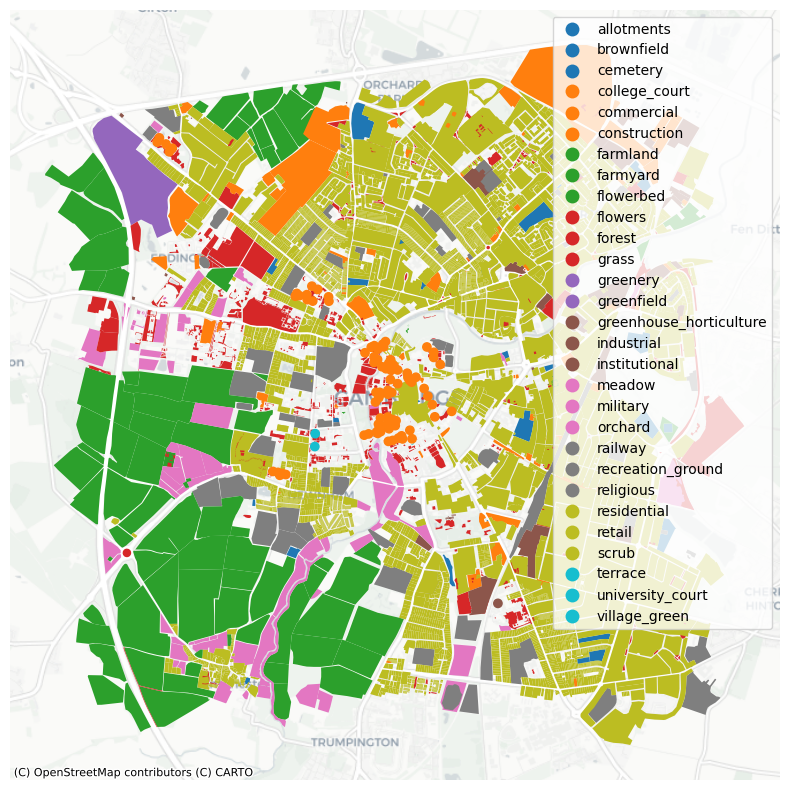

In [71]:
fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['landuse'].notna()].plot('landuse',
                                            ax=ax,
                                            categorical=True,
                                            legend=True)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

In [72]:
# select for desired locations
desired_categories = ['residential', 'forest', 'grass', 'farmland',
                      'greenfield', 'meadow', 'allotments', 'village_green']
filtered_cambridge = all_geom[all_geom['landuse'].isin(desired_categories)]

In [73]:
# get specific colors for mapping landuse
n_colors = 8

# Get the Pastel2 colormap
cmap = plt.cm.get_cmap('Pastel2', n_colors)

# Retrieve RGBA values for each color/category
colors_rgba = [cmap(i) for i in range(cmap.N)]

# If you want to convert RGBA to hex colors 
colors_hex = [mcolors.rgb2hex(color) for color in colors_rgba]

print(colors_hex)

['#b3e2cd', '#fdcdac', '#cbd5e8', '#f4cae4', '#e6f5c9', '#fff2ae', '#f1e2cc', '#cccccc']


/var/folders/lx/144t732x4hs49_9vxz4j63rh0000gn/T/ipykernel_34485/1021495808.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('Pastel2', n_colors)


In [74]:
category_color_map = {
    'allotments': colors_hex[0],
    'farmland': colors_hex[1],
    'forest': colors_hex[2],
    'grass': colors_hex[3],
    'greenfield': colors_hex[4],
    'meadow': colors_hex[5],
    'village_green': colors_hex[6],
    'residential': colors_hex[7]}


In [75]:
filtered_cambridge['color'] = filtered_cambridge['landuse'].map(category_color_map)

/Users/ciaraclarke/anaconda3/envs/envGEOG0051/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


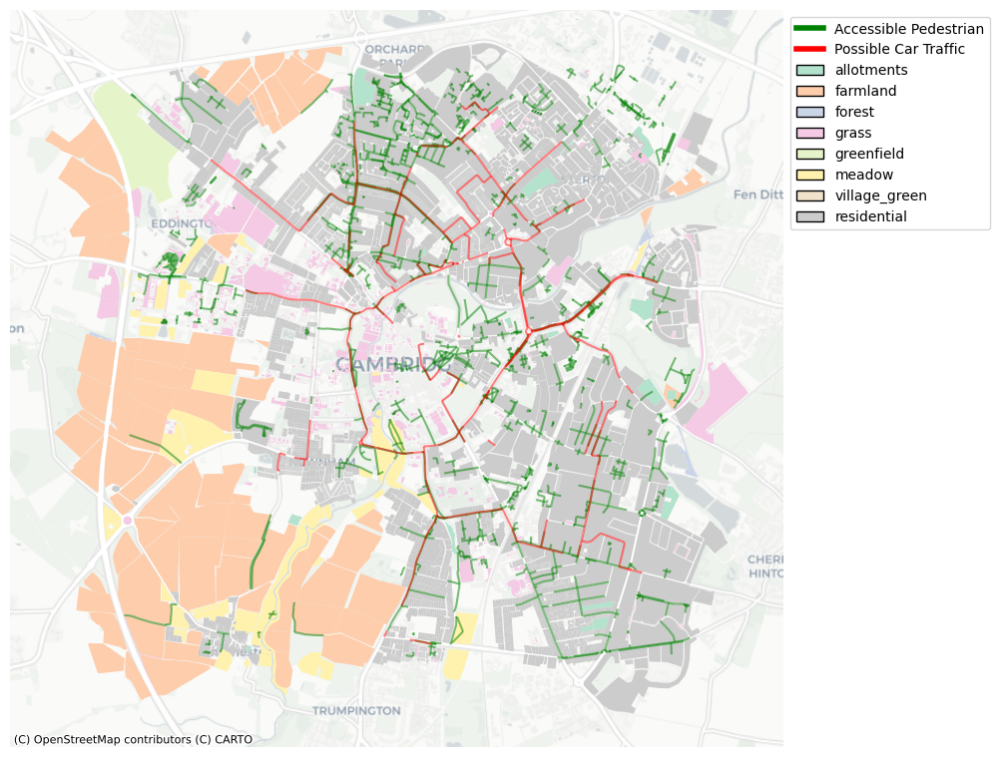

In [76]:
fig, ax = plt.subplots(figsize=(10, 10))  # Create a figure and a set of subplots

# Plot the first GeoDataFrame
gdf_pedestrian_filtered.plot(ax=ax, color='green', edgecolor='black', alpha=0.5, label='Accessible Pedestrian')

# Plot the second GeoDataFrame on the same axes object
gdf_driving_filtered.plot(ax=ax, color='red', edgecolor='black', alpha=0.5, label='Possible Car Traffic')

for category, group in filtered_cambridge.groupby('landuse'):
    group.plot(ax=ax, color=category_color_map[category], label=category)


custom_legend_elements = [Line2D([0], [0], color='green', lw=4, label='Accessible Pedestrian'),
                   Line2D([0], [0], color='red', lw=4, label='Possible Car Traffic')]

landuse_legend_elements = [Patch(facecolor=category_color_map[label], edgecolor='black', label=label) for label in category_color_map]

all_legend_elements = custom_legend_elements + landuse_legend_elements

# Create and display the combined legend
ax.legend(handles=all_legend_elements, loc='upper left', bbox_to_anchor=(1, 1))
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()